# Single-Cell Multiome Analysis

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as ad
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score, silhouette_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.decomposition import PCA
from sklearn.cross_decomposition import CCA
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
import warnings
import os
warnings.filterwarnings('ignore')

In [2]:
sc.settings.verbosity = 1
sc.settings.set_figure_params(dpi=300, facecolor='white', fontsize=12)
plt.rcParams['pdf.fonttype'] = 42  # TrueType fonts for PDF
plt.rcParams['ps.fonttype'] = 42
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Arial', 'DejaVu Sans']

In [3]:
def compute_metrics(adata, rep="X_dae"):
    """ Compute ARI, silhouette and kNN purity """
    X = adata.obsm[rep]
    labels = adata.obs["cell_type"].values

    # ARI
    n_clusters = len(np.unique(labels))
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
    pred_labels = kmeans.fit_predict(X)
    ari = adjusted_rand_score(labels_true=labels, labels_pred=pred_labels)

    # silhouette
    sil = silhouette_score(X, labels)

    # kNN purity
    knn = KNeighborsClassifier(n_neighbors=15)
    knn.fit(X, labels)
    preds = knn.predict(X)
    purity = (preds == labels).mean()

    return ari, sil, purity

### Load

In [4]:
adata = sc.read_10x_h5("10k_PBMC_Multiome_nextgem_Chromium_X_filtered_feature_bc_matrix.h5", gex_only=False)
adata

AnnData object with n_obs × n_vars = 10970 × 148344
    var: 'gene_ids', 'feature_types', 'genome', 'interval'

In [5]:
adata.var['feature_types']

MIR1302-2HG               Gene Expression
FAM138A                   Gene Expression
OR4F5                     Gene Expression
AL627309.1                Gene Expression
AL627309.3                Gene Expression
                               ...       
KI270713.1:25837-26623              Peaks
KI270713.1:29669-30477              Peaks
KI270713.1:32767-33478              Peaks
KI270713.1:34197-35025              Peaks
KI270713.1:36904-37809              Peaks
Name: feature_types, Length: 148344, dtype: object

In [6]:
adata.var['feature_types'].value_counts()

feature_types
Peaks              111743
Gene Expression     36601
Name: count, dtype: int64

In [7]:
# split rna and atac
rna_mask = adata.var['feature_types'] == 'Gene Expression'
atac_mask = adata.var['feature_types'] == 'Peaks'

In [8]:
adata_rna = adata[:, rna_mask].copy()
adata_atac = adata[:, atac_mask].copy()

In [9]:
adata_rna

AnnData object with n_obs × n_vars = 10970 × 36601
    var: 'gene_ids', 'feature_types', 'genome', 'interval'

In [10]:
adata_atac

AnnData object with n_obs × n_vars = 10970 × 111743
    var: 'gene_ids', 'feature_types', 'genome', 'interval'

### Data Exploration

In [11]:
# QC metrics for RNA
adata_rna.var["mt"] = adata_rna.var_names.str.startswith("MT-")
adata_rna

AnnData object with n_obs × n_vars = 10970 × 36601
    var: 'gene_ids', 'feature_types', 'genome', 'interval', 'mt'

In [12]:
sc.pp.calculate_qc_metrics(adata_rna, qc_vars=['mt'], percent_top=None, 
                           log1p=False, inplace=True)

adata_rna

AnnData object with n_obs × n_vars = 10970 × 36601
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'genome', 'interval', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [13]:
# QC metrics for ATAC
sc.pp.calculate_qc_metrics(adata_atac, percent_top=None, log1p=False, inplace=True)

adata_atac

AnnData object with n_obs × n_vars = 10970 × 111743
    obs: 'n_genes_by_counts', 'total_counts'
    var: 'gene_ids', 'feature_types', 'genome', 'interval', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [14]:
print("\n=== QC SUMMARY ===")
print(f"\nRNA-seq:")
print(f"  Mean UMI counts/cell: {adata_rna.obs['total_counts'].mean():.0f}")
print(f"  Median UMI counts/cell: {adata_rna.obs['total_counts'].median():.0f}")
print(f"  Mean % MT reads: {adata_rna.obs['pct_counts_mt'].mean():.2f}%")
print(f"  Mean genes/cell: {adata_rna.obs['n_genes_by_counts'].mean():.0f}")


=== QC SUMMARY ===

RNA-seq:
  Mean UMI counts/cell: 2885
  Median UMI counts/cell: 2506
  Mean % MT reads: 8.82%
  Mean genes/cell: 1435


In [15]:
print(f"\nATAC-seq:")
print(f"  Mean fragments/cell: {adata_atac.obs['total_counts'].mean():.0f}")
print(f"  Median fragments/cell: {adata_atac.obs['total_counts'].median():.0f}")
print(f"  Mean peaks/cell: {adata_atac.obs['n_genes_by_counts'].mean():.0f}")


ATAC-seq:
  Mean fragments/cell: 23575
  Median fragments/cell: 22516
  Mean peaks/cell: 8909


In [16]:
# filtering
sc.pp.filter_cells(adata_rna, min_genes=200)
sc.pp.filter_genes(adata_rna, min_cells=3)
adata_rna = adata_rna[adata_rna.obs['pct_counts_mt'] < 20, :]

In [17]:
sc.pp.filter_cells(adata_atac, min_genes=100)
sc.pp.filter_genes(adata_atac, min_cells=3)

In [18]:
# keep only cells present in both modalities
common_cells = adata_rna.obs_names.intersection(adata_atac.obs_names)
adata_rna = adata_rna[common_cells, :].copy()
adata_atac = adata_atac[common_cells, :].copy()

adata_rna.shape, adata_atac.shape

((10501, 25648), (10501, 111743))

In [19]:
# preprocessing RNA
sc.pp.normalize_total(adata_rna, target_sum=1e4)
sc.pp.log1p(adata_rna)
sc.pp.highly_variable_genes(adata_rna, n_top_genes=2000)
adata_rna_hvg = adata_rna[:, adata_rna.var['highly_variable']].copy()

adata_rna_hvg

AnnData object with n_obs × n_vars = 10501 × 2000
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes'
    var: 'gene_ids', 'feature_types', 'genome', 'interval', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'

In [20]:
# preprocessing atac
sc.pp.normalize_total(adata_atac, target_sum=1e4)
sc.pp.log1p(adata_atac)
sc.pp.highly_variable_genes(adata_atac, n_top_genes=5000)
adata_atac_hvg = adata_atac[:, adata_atac.var['highly_variable']].copy()

adata_atac_hvg

AnnData object with n_obs × n_vars = 10501 × 5000
    obs: 'n_genes_by_counts', 'total_counts', 'n_genes'
    var: 'gene_ids', 'feature_types', 'genome', 'interval', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'

In [21]:
# pca
sc.pp.scale(adata_rna_hvg)
sc.tl.pca(adata_rna_hvg, n_comps=50)

sc.pp.scale(adata_atac_hvg)
sc.tl.pca(adata_atac_hvg, n_comps=50)

In [22]:
# umap
sc.pp.neighbors(adata_rna_hvg, n_neighbors=15, n_pcs=50)
sc.tl.umap(adata_rna_hvg)
sc.tl.leiden(adata_rna_hvg, resolution=0.5, key_added='cell_type')

sc.pp.neighbors(adata_atac_hvg, n_neighbors=15, n_pcs=50)
sc.tl.umap(adata_atac_hvg)
adata_atac_hvg.obs['cell_type'] = adata_rna_hvg.obs['cell_type']

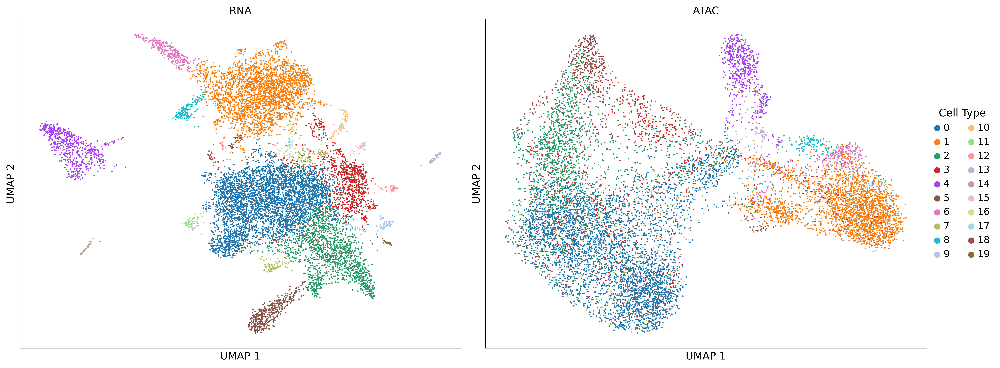

In [23]:
# visualization
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

sc.pl.umap(adata_rna_hvg, color='cell_type', ax=axes[0], show=False, 
          title='RNA', legend_loc='none', frameon=True)
sc.pl.umap(adata_atac_hvg, color='cell_type', ax=axes[1], show=False, 
          title='ATAC', legend_loc='right margin', legend_fontsize=11, frameon=True)

# Add legend title
legend = axes[1].get_legend()
if legend:
    legend.set_title('Cell Type', prop={'size': 12})

# improve aesthetics
for ax in axes:
    ax.set_xlabel('UMAP 1', fontsize=12)
    ax.set_ylabel('UMAP 2', fontsize=12)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

plt.tight_layout()
# plt.savefig('qc_umaps.pdf', format='pdf', dpi=300, bbox_inches='tight')
plt.savefig('figures/qc_umaps.png', dpi=300, bbox_inches='tight')
plt.show()

In [24]:
# save
adata_rna.write('data/rna.h5ad')
adata_atac.write('data/atac_ga.h5ad')

### Latent Modeling

In [25]:
class DAE(nn.Module):
    def __init__(self, input_dim, latent_dim=32):
        super().__init__()

        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024),
            nn.BatchNorm1d(1024),
            nn.ReLU(),
            nn.Dropout(p=0.1),
            nn.Linear(1024, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(),
            nn.Dropout(p=0.1),
            nn.Linear(512, latent_dim)
        )

        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(),
            nn.Linear(512, 1024),
            nn.BatchNorm1d(1024),
            nn.ReLU(),
            nn.Linear(1024, input_dim)
        )

    def forward(self, x):
        latent = self.encoder(x)
        reconstructed = self.decoder(latent)
        return reconstructed, latent

In [26]:
def train_dae(X, latent_dim=32, epochs=100, batch_size=256, lr=0.0005, noise_factor=0.15):
    """Train denoising autoencoder"""
    # device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    device = torch.device("cpu")

    # prepare data
    X_tensor = torch.FloatTensor(X).to(device)
    dataset = TensorDataset(X_tensor)
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

    # model
    model = DAE(input_dim=X.shape[1], latent_dim=latent_dim).to(device)
    optimizer = optim.Adam(model.parameters(), lr=lr)
    criterion = nn.MSELoss()

    # training
    model.train()
    for epoch in range(epochs):
        epoch_loss = 0
        for batch in dataloader:
            x_clean = batch[0]

            # add noise
            noise = torch.randn_like(x_clean) * noise_factor    # randn_like(x_clean) random tensor with shape x_clean from N(0, 1^2)
            x_noisy = x_clean + noise

            optimizer.zero_grad()
            X_recon, _ = model(x_noisy)
            loss = criterion(X_recon, x_clean)
            loss.backward()
            optimizer.step()    # perform a single optim step to update param

            epoch_loss += loss.item()

        if (epoch + 1) % 10 == 0:
            print(f"  Epoch {epoch+1}/{epochs}, Loss: {epoch_loss/len(dataloader):.4f}")

    # get latent
    model.eval()
    with torch.no_grad():
        _, latent = model(X_tensor)
        latent = latent.cpu().numpy()
    
    return model, latent

In [27]:
adata_rna_hvg.X.shape, adata_rna_hvg.X

((10501, 2000),
 array([[-0.02529504, -0.10136124, -0.0340296 , ..., -0.14742423,
          2.67771765, -0.03511419],
        [-0.02529504, -0.10136124, -0.0340296 , ..., -0.14742423,
         -0.29143828, -0.03511419],
        [-0.02529504, -0.10136124, -0.0340296 , ..., -0.14742423,
         -0.29143828, -0.03511419],
        ...,
        [-0.02529504, -0.10136124, -0.0340296 , ..., -0.14742423,
         -0.29143828, -0.03511419],
        [-0.02529504, -0.10136124, -0.0340296 , ..., -0.14742423,
         -0.29143828, -0.03511419],
        [-0.02529504, -0.10136124, -0.0340296 , ..., -0.14742423,
         -0.29143828, -0.03511419]], shape=(10501, 2000)))

In [28]:
# train RNA DAE
X_rna = adata_rna_hvg.X.toarray() if hasattr(adata_rna_hvg.X, "toarray") else adata_rna_hvg.X
rna_model, rna_latent = train_dae(X_rna, latent_dim=32, epochs=100)
adata_rna_hvg.obsm["X_dae"] = rna_latent

  Epoch 10/100, Loss: 0.9248
  Epoch 20/100, Loss: 0.8488
  Epoch 30/100, Loss: 0.7720
  Epoch 40/100, Loss: 0.7313
  Epoch 50/100, Loss: 0.6940
  Epoch 60/100, Loss: 0.6775
  Epoch 70/100, Loss: 0.6654
  Epoch 80/100, Loss: 0.6553
  Epoch 90/100, Loss: 0.6526
  Epoch 100/100, Loss: 0.6490


In [29]:
adata_atac_hvg.X.shape, adata_atac_hvg.X

((10501, 5000),
 array([[-0.07975115, -0.18570667, -0.6786649 , ..., -0.03868898,
         -0.05234968, -0.21572441],
        [-0.07975115, -0.18570667,  0.97591116, ..., -0.03868898,
         -0.05234968, -0.21572441],
        [-0.07975115, -0.18570667, -0.6786649 , ..., -0.03868898,
         -0.05234968, -0.21572441],
        ...,
        [-0.07975115, -0.18570667, -0.6786649 , ..., -0.03868898,
         -0.05234968,  5.18572247],
        [-0.07975115, -0.18570667,  1.13073301, ..., -0.03868898,
         -0.05234968, -0.21572441],
        [-0.07975115, -0.18570667, -0.6786649 , ..., -0.03868898,
         -0.05234968, -0.21572441]], shape=(10501, 5000)))

In [30]:
# train ATAC DAE
X_atac = adata_atac_hvg.X.toarray() if hasattr(adata_atac_hvg.X, 'toarray') else adata_atac_hvg.X
atac_model, atac_latent = train_dae(X_atac, latent_dim=32, epochs=100)
adata_atac_hvg.obsm["X_dae"] = atac_latent

  Epoch 10/100, Loss: 0.9550
  Epoch 20/100, Loss: 0.9192
  Epoch 30/100, Loss: 0.8884
  Epoch 40/100, Loss: 0.8558
  Epoch 50/100, Loss: 0.8314
  Epoch 60/100, Loss: 0.8231
  Epoch 70/100, Loss: 0.8232
  Epoch 80/100, Loss: 0.8021
  Epoch 90/100, Loss: 0.7921
  Epoch 100/100, Loss: 0.7917


In [31]:
# latent space umaps
sc.pp.neighbors(adata_rna_hvg, use_rep='X_dae', n_neighbors=15)
sc.tl.umap(adata_rna_hvg)

sc.pp.neighbors(adata_atac_hvg, use_rep='X_dae', n_neighbors=15)
sc.tl.umap(adata_atac_hvg)

In [32]:
# eval metrics
rna_ari_pca, rna_sil_pca, rna_purity_pca = compute_metrics(adata=adata_rna_hvg, rep="X_pca")
rna_ari_dae, rna_sil_dae, rna_purity_dae = compute_metrics(adata=adata_rna_hvg, rep="X_dae")

atac_ari_pca, atac_sil_pca, atac_purity_pca = compute_metrics(adata=adata_atac_hvg, rep="X_pca")
atac_ari_dae, atac_sil_dae, atac_purity_dae = compute_metrics(adata=adata_atac_hvg, rep="X_dae")

In [33]:
results = pd.DataFrame({
    "Modality":     ["RNA-PCA", "RNA-DAE", "ATAC-PCA", "ATAC-DAE"],
    "ARI":          [rna_ari_pca, rna_ari_dae, atac_ari_pca, atac_ari_dae],
    "Silhouette":   [rna_sil_pca, rna_sil_dae, atac_sil_pca, atac_sil_dae],
    "kNN Purity":   [rna_purity_pca, rna_purity_dae, atac_purity_pca, atac_purity_dae]
})

results

,Modality,ARI,Silhouette,kNN Purity
0,RNA-PCA,0.647863,0.200160,0.951338
1,RNA-DAE,0.476431,-0.026206,0.805447
2,ATAC-PCA,0.467754,0.000013,0.785735
3,ATAC-DAE,0.237584,-0.091712,0.791163


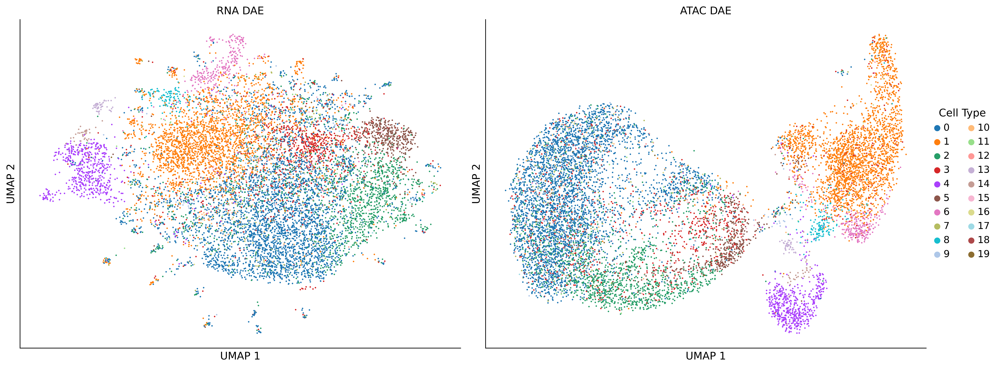

In [34]:
# plot DAE umaps
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
sc.pl.umap(adata_rna_hvg, color='cell_type', ax=axes[0], show=False, 
          title='RNA DAE', legend_loc='none', frameon=True)
sc.pl.umap(adata_atac_hvg, color='cell_type', ax=axes[1], show=False, 
          title='ATAC DAE', legend_loc='right margin', legend_fontsize=11, frameon=True)

# Add legend title
legend = axes[1].get_legend()
if legend:
    legend.set_title('Cell Type', prop={'size': 12})

# improve aesthetics
for ax in axes:
    ax.set_xlabel('UMAP 1', fontsize=12)
    ax.set_ylabel('UMAP 2', fontsize=12)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)


plt.tight_layout()
# plt.savefig('dae_umaps.pdf', format='pdf', dpi=300, bbox_inches='tight')
plt.savefig('figures/dae_umaps.png', dpi=300, bbox_inches='tight')
plt.show()

### Multiome Integration

In [35]:
# CCA 
cca = CCA(n_components=20)
rna_cca, atac_cca = cca.fit_transform(rna_latent, atac_latent)

rna_cca.shape, atac_cca.shape

((10501, 20), (10501, 20))

In [36]:
rna_cca

array([[-2.39283894, -1.81488495, -1.50056924, ..., -2.41255583,
        -0.84696823,  0.4749092 ],
       [ 0.96887194, -2.2291864 , -1.37048846, ..., -0.41621519,
         0.12410288, -0.09614903],
       [-0.47482087,  0.66186274, -2.21765824, ..., -0.29046655,
         2.61354725,  1.59716866],
       ...,
       [ 0.38932156,  0.69093353,  0.18464442, ..., -0.25294721,
         0.24014393, -0.18514499],
       [ 1.22843832,  0.787463  , -0.37009935, ..., -0.70920666,
         0.98869636, -0.75664271],
       [ 0.62882574, -1.16482024, -0.89852879, ..., -0.48599592,
         1.03337104, -0.74250216]], shape=(10501, 20))

In [37]:
print(f"Canonical correlation:{np.corrcoef(rna_cca[:, 0], atac_cca[:, 0])[0, 1]:.3f}")

Canonical correlation:0.676


In [38]:
# joint representation
joint_latent = np.concatenate([rna_cca, atac_cca], axis=1)
joint_latent.shape

(10501, 40)

In [39]:
# create joint anndata
adata_joint = adata_rna_hvg.copy()
adata_joint.obsm["X_joint"] = joint_latent

adata_joint

AnnData object with n_obs × n_vars = 10501 × 2000
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes', 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome', 'interval', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'cell_type', 'cell_type_colors'
    obsm: 'X_pca', 'X_umap', 'X_dae', 'X_joint'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [40]:
# joint umap
sc.pp.neighbors(adata_joint, use_rep="X_joint", n_neighbors=15)
sc.tl.umap(adata_joint)

In [41]:
# eval
joint_ari, joint_sil, joint_purity = compute_metrics(adata=adata_joint, rep="X_joint")

comparison = pd.DataFrame({
    "Method":       ["RNA-DAE", "ATAC-DAE", "Joint-CCA"],
    "ARI":          [rna_ari_dae, atac_ari_dae, joint_ari],
    "Silhouette":   [rna_sil_dae, atac_sil_dae, joint_sil],
    "kNN Purity":   [rna_purity_dae, atac_purity_dae, joint_purity]
})

comparison

,Method,ARI,Silhouette,kNN Purity
0,RNA-DAE,0.476431,-0.026206,0.805447
1,ATAC-DAE,0.237584,-0.091712,0.791163
2,Joint-CCA,0.490448,0.008021,0.818017


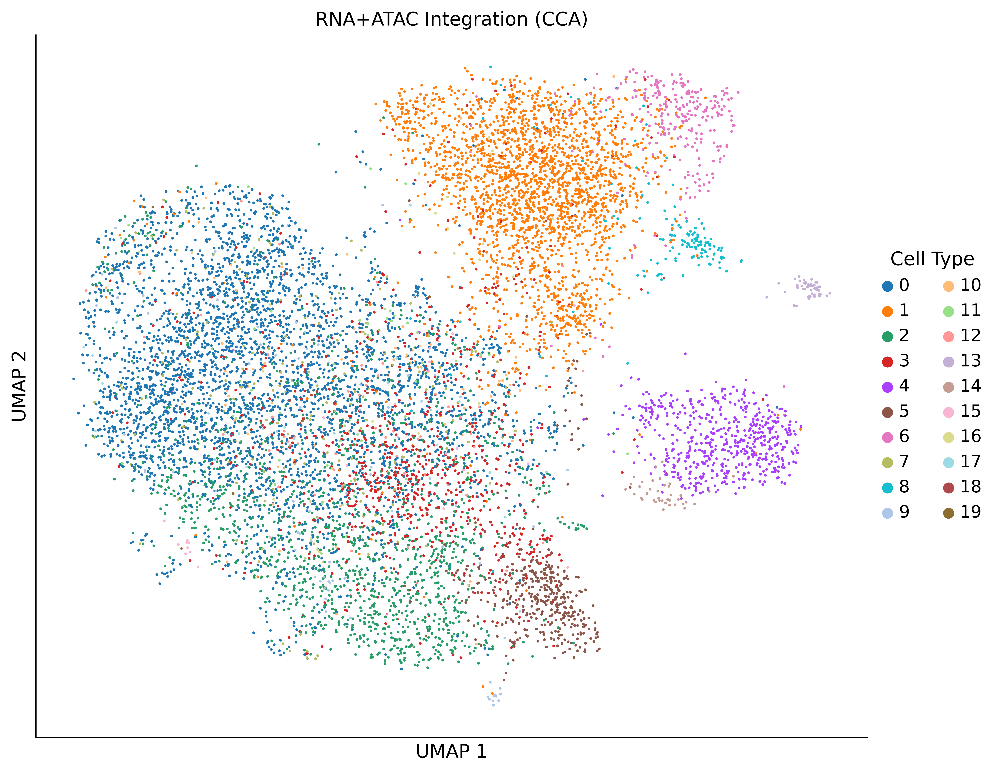

In [42]:
# joint plot
fig, ax = plt.subplots(figsize=(9, 7))
sc.pl.umap(adata_joint, color='cell_type', ax=ax, show=False, 
          title='RNA+ATAC Integration (CCA)', legend_fontsize=11, frameon=True)

# Add legend title
legend = ax.get_legend()
if legend:
    legend.set_title('Cell Type', prop={'size': 12})

# aesthetics
ax.set_xlabel('UMAP 1', fontsize=12)
ax.set_ylabel('UMAP 2', fontsize=12)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.tight_layout()
# plt.savefig('joint_umap.pdf', format='pdf', dpi=300, bbox_inches='tight')
plt.savefig('figures/joint_umap.png', dpi=300, bbox_inches='tight')
plt.show()

### Generative Extension (VAE)

In [43]:
class VAE(nn.Module):
    def __init__(self, input_dim, latent_dim=32):
        super().__init__()

        # encoder: X -> mean and variance of latent distr
        self.enc1 = nn.Linear(input_dim, 512)
        self.enc2 = nn.Linear(512, 256)
        self.enc3 = nn.Linear(256, 128)
        # Z
        self.fc_mu = nn.Linear(128, latent_dim) # mean of Z
        self.fc_logvar = nn.Linear(128, latent_dim) # log(variance) of Z

        # decoder: Z -> X' (reconstruct data from latent sample)
        self.dec1 = nn.Linear(latent_dim, 128)
        self.dec2 = nn.Linear(128, 256)
        self.dec3 = nn.Linear(256, 512)
        self.dec4 = nn.Linear(512, input_dim)

    def encode(self, x):
        """ Map X to latent distr params mu and logvar """
        h = torch.relu(self.enc1(x))
        h = torch.relu(self.enc2(h))
        h = torch.relu(self.enc3(h))
        return self.fc_mu(h), torch.clamp(self.fc_logvar(h), min=-10, max=10)   # clamp logvar to avoid explosion
    
    def reparameterize(self, mu, logvar):
        """ Sample Z from N(mu, var) using reparameterization trick: Z = mu + std * eps """
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std) # sample eps ~ N(0, 1)
        return mu + eps * std
    
    def decode(self, z):
        """ Reconstruct X from Z """
        h = torch.relu(self.dec1(z))
        h = torch.relu(self.dec2(h))
        h = torch.relu(self.dec3(h))
        return self.dec4(h)
    
    def forward(self, x):
        """ Forward pass: X -> (mu, var) -> Z ~ N(mu, var) -> X' """
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        return self.decode(z), mu, logvar
    

In [44]:
def vae_loss(recon_x, x, mu, logvar):
    """ VAE loss = Reconstruction loss + KL div """

    recon_loss = nn.functional.mse_loss(recon_x, x, reduction="mean")
    
    # KL div: how close is P(Z|X) to standard normal N(0, 1)
    kld = -0.5 * torch.mean(1 + logvar - mu.pow(2) - logvar.exp())
    kld = torch.clamp(kld, 0, 100)  # clamp to prevent explosion
    
    return recon_loss + 0.001 * kld

In [45]:
def train_vae(X, latent_dim=32, epochs=40, batch_size=256, lr=0.0001):
    device = torch.device("cpu")

    X_tensor = torch.FloatTensor(X).to(device)
    dataset = TensorDataset(X_tensor)
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

    model = VAE(input_dim=X.shape[1], latent_dim=latent_dim).to(device)

    # Xavier initialization for stable training
    for m in model.modules():
        if isinstance(m, nn.Linear):
            nn.init.xavier_uniform_(m.weight)
            if m.bias is not None:
                nn.init.zeros_(m.bias)

    optimizer = optim.Adam(model.parameters(), lr=lr)

    model.train()
    for epoch in range(epochs):
        epoch_loss = 0
        for batch in dataloader:
            x = batch[0]
            
            optimizer.zero_grad()
            recon, mu, logvar = model(x)
            loss = vae_loss(recon_x=recon, x=x, mu=mu, logvar=logvar)

            # check nan
            if torch.isnan(loss):
                print(f"  Warning: NaN loss at epoch {epoch+1}, skipping batch")
                continue

            loss.backward()
            # gradient clipping to prevent explosion
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)

            optimizer.step()
            epoch_loss += loss.item()

        if (epoch + 1) % 10 == 0:
            print(f"  Epoch {epoch+1}/{epochs}, Loss: {epoch_loss/len(dataloader):.4f}")

    model.eval()
    with torch.no_grad():
        mu, _ = model.encode(X_tensor)
        latent = mu.cpu().numpy()
    
    return model, latent

In [46]:
# train VAE on RNA
vae_model, vae_latent = train_vae(X_rna, latent_dim=32, epochs=30)
adata_rna_hvg.obsm["X_vae"] = vae_latent

adata_rna_hvg

  Epoch 10/30, Loss: 0.9631
  Epoch 20/30, Loss: 0.9523
  Epoch 30/30, Loss: 0.9114


AnnData object with n_obs × n_vars = 10501 × 2000
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes', 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome', 'interval', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'cell_type', 'cell_type_colors'
    obsm: 'X_pca', 'X_umap', 'X_dae', 'X_vae'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [47]:
# VAE eval
vae_ari, vae_sil, vae_purity = compute_metrics(adata_rna_hvg, "X_vae")

# DAE vs VAE
model_comparison = pd.DataFrame({
    "Model":        ["RNA-DAE", "RNA-VAE"],
    "ARI":          [rna_ari_dae, vae_ari],
    "Silhouette":   [rna_sil_dae, vae_sil],
    "kNN Purity":   [rna_purity_dae, vae_purity]
})

model_comparison

,Model,ARI,Silhouette,kNN Purity
0,RNA-DAE,0.476431,-0.026206,0.805447
1,RNA-VAE,0.580343,0.137320,0.872393


In [48]:
print("Generating 5 synthetic cells from latent space with VAE")
vae_model.eval()
with torch.no_grad():
    # sample from N(0, 1)
    z_samples = torch.randn(5, 32)

    # generate synthetic gene expression
    synthetic_cells = vae_model.decode(z_samples).numpy()
    
    print(f"Synthetic cells shape: {synthetic_cells.shape}")
    print(f"Mean expression: {synthetic_cells.mean():.3f}, Std: {synthetic_cells.std():.3f}")

Generating 5 synthetic cells from latent space with VAE
Synthetic cells shape: (5, 2000)
Mean expression: -0.007, Std: 0.081


In [49]:
# save trained models
torch.save({
    "model_state_dict": vae_model.state_dict(),
    "latent_dim": 32,
    "input_dim": X_rna.shape[1],
    "gene_names": adata_rna_hvg.var_names.to_list()
}, "models/vae_model.pt")

torch.save({
    "rna_model_state_dict": rna_model.state_dict(),
    "atac_model_state_dict": atac_model.state_dict(),
    "latent_dim": 32
}, "models/dae_models.pt")

In [50]:
print("End of the notebook")

End of the notebook
